**Predicting Pass Interference & Defensive Grades**

Defensive coverage in the NFL is often a trade-off between the quality of the coverage and the risk of conceding a penalty for pass interference. For this analysis we develop several summary statistics to characterize the coverage of a defender on a target reciever. Using these summary statistics we develop two models one to predict pass interference being called and a second to determine the liklihood of play success. Using these two models we can rate a player based on their deviation from expected number of succesful passes against them and the expected number of pass interference calls against them. Defenders who give up less plays than expected and reciever less pass interference calls than expected given the coverage are more likely to be successful. 

*Preliminaries*

First we need to define several functions and pre-process the data to calculate summary statistics for the model. 

In [1]:
library(tidyverse) # Load tidyverse
library(xgboost) # Load XGBoost
library(ggplot2) # Load ggplot2
library(data.table) # Load data.table
library(ggrepel) # Load ggrepel
library(ggdark) # Load ggdark
library(ggExtra) # Load ggExtra

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘xgboost’


The following object is masked from ‘package:dplyr’:

    slice



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


The following object is masked from ‘package:purrr’:

    transpose




In [2]:

fix_coords <- function(pbf, plays, games){
  #'
  #' This function fixes the coordinates so that home and away plays
  #' are on the same scale
  #'
  #' @param pbf The frame by frame data
  #' @param plays The play level data
  #' @param games The game level data
  #'
  #' @return A data frame with the corrected coordinates
  #'
  # Create new x and y
  new_x <- pbf$x 
  new_y <- pbf$y
  
  # Create home and away indicator
  plays$home_away <- rep(NA, nrow(plays))
  # Create indicator for frame by frame
  frame_ind <- rep(NA, nrow(pbf))
  
  # Loop through and correct data
  # For each play
  for(i in 1:nrow(plays)){
    # Extract game data
    game_dat <- games[games$gameId == plays$gameId[i],]
    # If possession is home team
    if(plays$possessionTeam[i] == game_dat$homeTeamAbbr){
      # Assign home to play data frame
      plays$home_away[i] <- "home"
      # Assign home to relevant frames
      frame_ind[pbf$playId == plays$playId[i] &
                  pbf$gameId == plays$gameId[i]] <- "home"
      # If possession is away team
    } else {
      # Assign away to play data frame
      plays$home_away[i] <- "away"
      # Assign away to relevant data frame
      frame_ind[pbf$playId == plays$playId[i] &
                  pbf$gameId == plays$gameId[i]] <- "away"
    }
  }
  
  # Calculate new x and y
  new_x[frame_ind == "away"] <- 120 - pbf$x[frame_ind == "away"]
  new_y[frame_ind == "away"] <- 53.3 - pbf$y[frame_ind == "away"]
  # Assign new x and y
  pbf$x <- new_x
  pbf$y <- new_y
  # Return corrected data
  return(pbf)
}

calculate_frame_distance <- function(play_db, frames){
  #'
  #' This function calculates the distance between each of the players
  #' and the ball at each frame
  #' 
  #' @param play_db The frame by frame data for a single play
  #' @param frames The unique frames for the play
  #'
  #'
  #' @return A list which contains a distance matrix for each frame
  #' 
  #' 
  
  # Create list to store distances
  frame_dist <- vector(mode = "list", length = length(frames))
  
  # For each frame
  for(j in 1:length(frames)){
    ### Calculate distances ###
    # Extract info for single frame
    t_1 <- play_db[play_db$frameId == j,]
    # Calculate distance matrix
    dist_mat <- as.matrix(dist(t_1[, c("x", "y") ]))
    # Assign names to distance matrix
    colnames(dist_mat) <- rownames(dist_mat) <- t_1$nflId
    # Store distance matrix
    frame_dist[[j]] <- dist_mat
  }
  
  # Return distances at each frame
  return(frame_dist)
}

calculate_release_point <- function(players, frames, frame_dist){
  #'
  #' This function uses the distance from the QB to the ball
  #' at each frame to identify a pseudo-release point. This is estimated as
  #' the point where the QB is closest to the ball. 
  #' 
  #' @param players The data frame with the information for the players
  #'  involved in the play
  #' @param frames The unique frames in the play
  #' @param frame_dist The distance between each player and the ball at each frame. 
  #' Calculated using the 'calculate_frame_dist' function
  #'  
  #' @return the estimated release point 
  #' 
  #'  
  
  # Identify qb
  qb <- players$nflId[players$position == "QB"][1]
  # Create vector to store release point
  qb_to_ball_out <- rep(NA,length(frames))
  # For each frame
  for(j in 1:length(frames)){
    # Check QB is in the frame
    if(qb %in% rownames(frame_dist[[j]]) &
       "Football" %in% colnames(frame_dist[[j]])){
      # Extract distance from QB to ball
      qb_to_ball_out[j] <- frame_dist[[j]][rownames(frame_dist[[j]]) == qb,
                                           colnames(frame_dist[[j]]) =="Football"]
    }
    
  }
  # Identify closest frame
  release_point <- which.min(qb_to_ball_out)
  # Return results
  return(release_point)
}


summary_stat_calc_1 <- function(frames, play_recivers,
                                play_defenders, frame_dist,
                                play_db){
  #'
  #' This function calculates the closest defender distance, 
  #' reciver depth, distance from reciver to the ball, and 
  #' the difference in angle the reciever is facing to the ball
  #'
  #' @param frames The unique frames for the play
  #' @param play_recivers The recivers on the play
  #' @param play_defenders The defenders on the play
  #' @param frame_dist The list with distance between each of the players
  #' for each frame
  #' @param play_db The data frame with the frame by frame data
  #'
  #'
  #'
  
  # Create data frames to store clearance, depth and ball distance
  rec_clearance <- rec_depth <- ball_distance <- ball_angle_diff <- 
    as.data.frame(matrix(NA, nrow = length(frames),ncol=length(play_recivers)))
  # Name columns
  names(rec_clearance) <- names(rec_depth) <- names(ball_distance) <-  names(ball_angle_diff) <- 
    play_recivers
  # For each frame
  for(x in 1:nrow(rec_clearance)){
    # For each player
    for(j in 1:ncol(rec_clearance)){
      # Check reciver and football in each frame
      if(names(rec_clearance)[j] %in% rownames(frame_dist[[x]]) &
         "Football" %in% colnames(frame_dist[[x]])){
        # Calculate closest defender distance
        rec_clearance[x,j] <- 
          min(frame_dist[[x]][rownames(frame_dist[[x]]) == names(rec_clearance)[j],
                              colnames(frame_dist[[x]]) %in% c(play_defenders)])
        # Calculate depth
        rec_depth[x,j] <- play_db$x[play_db$nflId == names(rec_depth)[j] &
                                      play_db$frameId == x &
                                      play_db$off_def == "Offense"]
        # Calculate distance to ball
        ball_distance[x,j] <- 
          frame_dist[[x]][rownames(frame_dist[[x]]) == names(rec_clearance)[j],
                          colnames(frame_dist[[x]]) == "Football"]
        
        ## Calculate angle to ball
        # Calculate y distance frome player to ball
        a <- play_db$y[play_db$nflId == names(rec_depth)[j] &
                         play_db$frameId == x] - play_db$y[play_db$nflId == "Football" &
                                                             play_db$frameId == x] 
        # Calculate angle to ball
        angle <- asin(a/ball_distance[x,j]) * (180/pi)
        # Calculate angle facing away from ball
        ball_angle_diff[x, j] <- min(abs(play_db$o[play_db$nflId == names(rec_depth)[j] &
                                                     play_db$frameId == x] - angle),
                                     abs(play_db$o[play_db$nflId == names(rec_depth)[j] &
                                                     play_db$frameId == x] + angle))
        
      }
    }
  }
  
  # Return results
  return(list(rec_clearance, rec_depth, ball_distance, ball_angle_diff))
}

summary_stat_calc_2 <- function(play_defenders, play_recivers, frame_dist, 
                                release_point, rec_point, play_db, frames,
                                target_reciever){
  #'
  #' This function calculates summary statistics for the defenders and the
  #' reciever they are closest to at the release point
  #'
  #' @param play_defenders The defenders on the play
  #' @param play_recievers The recievers on the play
  #' @param frame_dist The distance between each player and ball at each frame
  #' @param release_point The estimated release point for the ball
  #' @param rec_point The point of the reception
  #' @param play_db The frame by frame data for the play
  #' @param frames The unique frames for the play
  #' @param target_reciever The target reciever on the play
  #' 
  #' @return This function returns a data frame with the following columns:
  #' 
  #' play_defenders - The defender on the play
  #' def_a - Defensive assignment for the defender based on distance at release
  #' avg_dist - Average distance from defender to assignment
  #' dist_at_start - Distance to assignment at start of play
  #' dist_at_throw - Distance to assignment at release
  #' min_dist - Minimum distance to defensive assignment
  #' max_dist - Maximum distance to defensive assignment
  #' dist_at_catch - Distance to assignment at catch
  #' min_angle_5 - Minimum angle to ball in five frames prior to catch
  #' min_angle_10 - Minimum angle to ball in ten frames prior to catch
  #' max_angle_5 - Maximum angle to ball in five frames prior to catch
  #' max_angle_10 - Maximum angle to ball in ten frames prior to catch
  #' avg_angle_5 - Average angle to ball in five frames prior to catch
  #' avg_angle_10 - Average angle to ball in ten frames prior to catch
  #' target_reciever - Binary indicator of if defensive assignment is target reciever
  
  # Find defensive assignment
  def_a <- rep(NA, length(play_defenders))
  # Create vectors to store results
  avg_dist <- dist_at_start <- dist_at_throw <- min_dist <-
    max_dist <- dist_at_catch <- min_angle_5 <- min_angle_10 <-
    max_angle_5 <- max_angle_10 <- avg_angle_5 <- avg_angle_10 <- rep(NA, length(play_defenders))
  # Create matrix to store ball angle at each frame for each player
  def_ball_angle <-  as.data.frame(matrix(NA, nrow = length(frames),ncol=length(play_defenders)))
  # Name columns of ball angle
  names(def_ball_angle) <- play_defenders
  # For each defensive player
  for(j in 1:length(play_defenders)){
    if(play_defenders[j] %in% colnames(frame_dist[[release_point]])){
      # Identify closest reciever at release point
      def_a[j] <- play_recivers[which.min(frame_dist[[release_point]][play_defenders[j],
                                                                      play_recivers[play_recivers %in%
                                                                                      colnames(frame_dist[[release_point]])]])]
      # Create vector to store distances
      dist_vec <- rep(NA, length(frame_dist))
      # For each frame
      for(x in 1:length(frame_dist)){
        # Check reciver and assignment are in frame
        if(play_defenders[j] %in% rownames(frame_dist[[x]]) &
           def_a[j] %in% rownames(frame_dist[[x]])){
          # Calculate distance to defensive assignment at each frame
          dist_vec[x] <- frame_dist[[x]][play_defenders[j], def_a[j]]
          
          if("Football" %in% colnames(frame_dist[[x]])){
            # Calculate distance to ball
            def_ball_distance <- 
              frame_dist[[x]][rownames(frame_dist[[x]]) == play_defenders[j],
                              colnames(frame_dist[[x]]) == "Football"]
            
            ## Calculate angle to ball
            # Extract y distance for players to ball
            a <- play_db$y[play_db$nflId == play_defenders[j] &
                             play_db$frameId == x] - play_db$y[play_db$nflId == "Football" &
                                                                 play_db$frameId == x] 
            # Calculate angle to ball
            angle <- asin(a/def_ball_distance) * (180/pi)
            # Calculate difference in direction and angle to ball
            def_ball_angle[x, j] <- min(abs(play_db$o[play_db$nflId == play_defenders[j] &
                                                        play_db$frameId == x] - angle), 
                                        abs(play_db$o[play_db$nflId ==play_defenders[j] &
                                                        play_db$frameId == x] + angle))
          }
        } 
      }
      # Calculate average distance to closest reciever at release
      avg_dist[j] <- mean(dist_vec, na.rm = T)
      # Calculate distance to reciver at play start
      dist_at_start[j] <- dist_vec[1]
      # Calculate distance to reciver at release point
      dist_at_throw[j] <- dist_vec[release_point]
      # Calculate minimum distance to reciever
      min_dist[j] <- min(dist_vec, na.rm = T)
      # Calculate maximum distance to reciever
      max_dist[j] <- max(dist_vec, na.rm = T)
      # Calculate distance at catch point
      dist_at_catch[j] <- dist_vec[rec_point]
      
      # Calculate minimum angle within 5 frames
      min_angle_5[j] <- min(def_ball_angle[max(1,(rec_point - 5)):rec_point,j], na.rm = T)
      # Calculate minimum angle within 10 frames
      min_angle_10[j] <- min(def_ball_angle[max(1,(rec_point - 10)):rec_point,j], na.rm = T)
      
      # Calculate maximum angle within 5 frames
      max_angle_5[j] <- max(def_ball_angle[max(1,(rec_point - 5)):rec_point,j], na.rm = T)
      # Calculate maximum angle within 10 frames
      max_angle_10[j] <- max(def_ball_angle[max(1,(rec_point - 10)):rec_point,j], na.rm = T)       
      
      # Calculate average angle within 5 frames
      avg_angle_5[j] <- mean(def_ball_angle[max(1,(rec_point - 5)):rec_point,j], na.rm = T)
      # Calculate average angle within 10 frames
      avg_angle_10[j] <- mean(def_ball_angle[max(1,(rec_point - 10)):rec_point,j], na.rm = T)    
    }
  }
  
  # Join results together
  res <- cbind.data.frame(play_defenders, def_a,  avg_dist, dist_at_start,
                          dist_at_throw, min_dist, max_dist, dist_at_catch,
                          min_angle_5, min_angle_10, max_angle_5, max_angle_10, 
                          avg_angle_5, avg_angle_10)
  # Create binary indicator of target reciever
  target_rec <- rep(0, nrow(res))
  # Assign 1 if reciever is target
  target_rec[def_a == target_reciever] <- 1
  # Join vector to result data frame
  res$target_rec <- target_rec
  
  # Return results
  return(res)
}


summary_stat_calc_3 <- function(play_defenders, play_recivers, frame_dist, 
                                release_point, rec_point, play_db, frames, 
                                target_reciever){
  #'
  #' This function calculates summary statistics for the defenders and the
  #' reciever they are closest to at the reception point
  #'
  #' @param play_defenders The defenders on the play
  #' @param play_recievers The recievers on the play
  #' @param frame_dist The distance between each player and ball at each frame
  #' @param release_point The estimated release point for the ball
  #' @param rec_point The point of the reception
  #' @param play_db The frame by frame data for the play
  #' @param frames The unique frames for the play
  #' @param target_reciever The target reciever on the play
  #' 
  #' @return This function returns a data frame with the following columns:
  #' 
  #' play_defenders - The defender on the play
  #' def_a - Defensive assignment for the defender based on distance at release
  #' avg_dist - Average distance from defender to assignment
  #' dist_at_start - Distance to assignment at start of play
  #' dist_at_throw - Distance to assignment at release
  #' min_dist - Minimum distance to defensive assignment
  #' max_dist - Maximum distance to defensive assignment
  #' dist_at_catch - Distance to assignment at catch
  #' min_angle_5 - Minimum angle to ball in five frames prior to catch
  #' min_angle_10 - Minimum angle to ball in ten frames prior to catch
  #' max_angle_5 - Maximum angle to ball in five frames prior to catch
  #' max_angle_10 - Maximum angle to ball in ten frames prior to catch
  #' avg_angle_5 - Average angle to ball in five frames prior to catch
  #' avg_angle_10 - Average angle to ball in ten frames prior to catch
  #' target_reciever - Binary indicator of if defensive assignment is target reciever
  
  # Find defensive assignment
  def_a <- rep(NA, length(play_defenders))
  # Create vectors to store results
  avg_dist <- dist_at_start <- dist_at_throw <- min_dist <-
    max_dist <- dist_at_catch <- min_angle_5 <- min_angle_10 <-
    max_angle_5 <- max_angle_10 <- avg_angle_5 <- avg_angle_10 <- rep(NA, length(play_defenders))
  # Create matrix to store ball angle at each frame for each player
  def_ball_angle <-  as.data.frame(matrix(NA, nrow = length(frames),ncol=length(play_defenders)))
  # Name columns of ball angle
  names(def_ball_angle) <- play_defenders
  # For each defensive player
  for(j in 1:length(play_defenders)){
    if(play_defenders[j] %in% colnames(frame_dist[[rec_point]])){
      # Identify closest reciever at reception point
      def_a[j] <- play_recivers[which.min(frame_dist[[rec_point]][play_defenders[j],
                                                                  play_recivers[play_recivers %in% 
                                                                                  colnames(frame_dist[[rec_point]])]])]
      # Create vector to store distances
      dist_vec <- rep(NA, length(frame_dist))
      # For each frame
      for(x in 1:length(frame_dist)){
        # Check reciver and assignment are in frame
        if(play_defenders[j] %in% rownames(frame_dist[[x]]) &
           def_a[j] %in% rownames(frame_dist[[x]])){
          # Calculate distance to defensive assignment at each frame
          dist_vec[x] <- frame_dist[[x]][play_defenders[j], def_a[j]]
          
          if("Football" %in% colnames(frame_dist[[x]])){
            # Calculate distance to ball
            def_ball_distance <- 
              frame_dist[[x]][rownames(frame_dist[[x]]) == play_defenders[j],
                              colnames(frame_dist[[x]]) == "Football"]
            
            ## Calculate angle to ball
            # Extract y distance for players to ball
            a <- play_db$y[play_db$nflId == play_defenders[j] &
                             play_db$frameId == x] - play_db$y[play_db$nflId == "Football" &
                                                                 play_db$frameId == x] 
            # Calculate angle to ball
            angle <- asin(a/def_ball_distance) * (180/pi)
            # Calculate difference in direction and angle to ball
            def_ball_angle[x, j] <- min(abs(play_db$o[play_db$nflId == play_defenders[j] &
                                                        play_db$frameId == x] - angle), 
                                        abs(play_db$o[play_db$nflId ==play_defenders[j] &
                                                        play_db$frameId == x] + angle))
          }
        } 
      }
      # Calculate average distance to closest reciever at release
      avg_dist[j] <- mean(dist_vec, na.rm = T)
      # Calculate distance to reciver at play start
      dist_at_start[j] <- dist_vec[1]
      # Calculate distance to reciver at release point
      dist_at_throw[j] <- dist_vec[release_point]
      # Calculate minimum distance to reciever
      min_dist[j] <- min(dist_vec, na.rm = T)
      # Calculate maximum distance to reciever
      max_dist[j] <- max(dist_vec, na.rm = T)
      # Calculate distance at catch point
      dist_at_catch[j] <- dist_vec[rec_point]
      
      # Calculate minimum angle within 5 frames
      min_angle_5[j] <- min(def_ball_angle[max(1,(rec_point - 5)):rec_point,j], na.rm = T)
      # Calculate minimum angle within 10 frames
      min_angle_10[j] <- min(def_ball_angle[max(1,(rec_point - 10)):rec_point,j], na.rm = T)
      
      # Calculate maximum angle within 5 frames
      max_angle_5[j] <- max(def_ball_angle[max(1,(rec_point - 5)):rec_point,j], na.rm = T)
      # Calculate maximum angle within 10 frames
      max_angle_10[j] <- max(def_ball_angle[max(1,(rec_point - 10)):rec_point,j], na.rm = T)       
      
      # Calculate average angle within 5 frames
      avg_angle_5[j] <- mean(def_ball_angle[max(1,(rec_point - 5)):rec_point,j], na.rm = T)
      # Calculate average angle within 10 frames
      avg_angle_10[j] <- mean(def_ball_angle[max(1,(rec_point - 10)):rec_point,j], na.rm = T)  
    }
  }
  
  # Join results together
  res <- cbind.data.frame(play_defenders, def_a,  avg_dist, dist_at_start,
                          dist_at_throw, min_dist, max_dist, dist_at_catch,
                          min_angle_5, min_angle_10, max_angle_5, max_angle_10, 
                          avg_angle_5, avg_angle_10)
  # Create binary indicator of target reciever
  target_rec <- rep(0, nrow(res))
  # Assign 1 if reciever is target
  target_rec[def_a == target_reciever] <- 1
  # Join vector to result data frame
  res$target_rec <- target_rec
  
  # Change names to separate from assignment
  names(res)[2:ncol(res)] <- paste(names(res)[2:ncol(res)], "_e", sep = "")
  
  # Return results
  return(res)
}


depth_calc <- function(res_final, rec_point, rec_depth){
  #'
  #' This function calculates the reciever depth for each defensive 
  #' assignment at catch and end of play
  #' 
  #' @param res_final The previously calculated summary statistics
  #' @param rec_point The point of the reception
  #' @param rec_depth A data frame with reciever depth for each play
  #'
  #' @return A data frame with the defensive assignment depth at catch and end
  #' of play
  #' 
  
  # Create vectors to store results
  rec_depth_catch <- rec_depth_final <- rec_depth_catch_e <- rec_depth_final_e <- rep(NA, nrow(res_final))
  # For each row of results
  for(j in 1:nrow(res_final)){
    if(!is.na(res_final$def_a[j])){
      # Calculate reciever depth at catch for closest reciver at release
      rec_depth_catch[j] <- rec_depth[rec_point,names(rec_depth) == res_final$def_a[j]]
      # Calculate reciever final depth for closest reciver at release
      rec_depth_final[j] <- rec_depth[nrow(rec_depth),names(rec_depth) == res_final$def_a[j]]
    }
    
    if(!is.na(res_final$def_a_e[j])){
      # Calculate reciever depth at catch for closest reciver at catch
      rec_depth_catch_e[j] <- rec_depth[rec_point,names(rec_depth) == res_final$def_a_e[j]]
      # Calculate reciever final depth for closest reciver at catch
      rec_depth_final_e[j] <- rec_depth[nrow(rec_depth),names(rec_depth) == res_final$def_a_e[j]]
    }
    
  }
  # Join results together
  rec_res <- cbind.data.frame(rec_depth_catch, rec_depth_final, 
                              rec_depth_catch_e, rec_depth_final_e)
  # Return results
  return(rec_res)
}


stat_calc <- function(pbf, plays){
  #'
  #' This function calculates summary statistics for each defender for each
  #' play
  #' 
  #' @param pbf The frame-by-frame data
  #' @param plays The play level data frame
  #'
  #' @return A data frame with calculated summary statistics for each defender
  #' on each play
  
  # Keep only unique rows
  pbf <- unique(pbf)
  # Convert IDs to characters
  pbf$nflId <- as.character(pbf$nflId)
  pbf$nflId[is.na(pbf$nflId)] <- "Football"
  # Extract plays in play by play dataset
  pbf_plays <- unique(pbf[, c("gameId", "playId")])
  
  # Create list to store play stats
  play_res <- vector(mode = "list", length = nrow(pbf_plays))
  
  # For each play
  for(i in 1:nrow(pbf_plays)){
    print(i)
    # Extract frames for the given play
    play_db <- pbf[pbf$gameId == pbf_plays$gameId[i] &
                     pbf$playId == pbf_plays$playId[i],]
    
    # Extract players involved in play
    players <- unique(play_db[, c("displayName", "nflId", "position")])
    
    # Extract recievers
    play_recivers <- players$nflId[players$position %in% 
                                           c("WR", "TE", "RB", "FB", "HB")]
    # Extract defenders
    play_defenders <- players$nflId[players$position %in% 
                                            c("CB", "DB", "FS", "SS","S")]
    if(length(play_defenders) > 0 &
       length(play_recivers) > 0){
      # Extract frames
      frames <- unique(play_db$frameId)
      # Calculate distance between each player and ball at each frame
      frame_dist <- calculate_frame_distance(play_db, frames)
      
      ## Calculate release point
      release_point <- calculate_release_point(players, frames, frame_dist)
      if(length(release_point) > 0){
        ## Calculate summary stats 1
        sum_stats <- summary_stat_calc_1(frames, play_recivers,play_defenders,
                                         frame_dist,play_db)
        # Extract summary stats results
        rec_clearance <- sum_stats[[1]]
        rec_depth <- sum_stats[[2]]
        ball_distance <- sum_stats[[3]]
        ball_angle_diff <- sum_stats[[4]]
        
        # Drop empty rows
        #ball_distance <- na.omit(ball_distance)
        
        # Identify target reciver as reciever who gets closest to ball
        target_reciever <- play_recivers[which.min(apply(ball_distance,2, min, na.rm = T))]
        
        #' Identify reception point as position where target reciever gets within 1 
        #' yard of ball
        rec_point <- which(ball_distance[,target_reciever] < 1)[1]
        # If no reception point within a foot then choose closest
        if(is.na(rec_point)){
          rec_point <- which.min(ball_distance[,target_reciever]) 
        }
        
        # 2 Calculate defensive summary statistics 
        # - Reciever who defender is closest to at release point is assumed defensive assignment
        res <- summary_stat_calc_2(play_defenders, play_recivers, frame_dist, 
                                   release_point, rec_point, play_db, frames,
                                   target_reciever)
        
        ## Calculating stats for closest reciver at reception
        res_2 <- summary_stat_calc_3(play_defenders, play_recivers, frame_dist, 
                                     release_point, rec_point, play_db, frames,
                                     target_reciever)
        
        # Join results for closest reciver at catch and release
        res_all <-cbind.data.frame(res, res_2)
        
        ## 3 - Extract per play stats
        # Extract statistics for play
        play_stats <- plays[plays$gameId == pbf_plays$gameId[i] &
                              plays$playId == pbf_plays$playId[i],]
        # Create exmpty data frame to store replicated rows
        res_play <- as.data.frame(matrix(NA, nrow = nrow(res_all), ncol = ncol(play_stats)))
        # Assign result statistics
        res_play[,] <- play_stats
        # Add names to play statistics
        names(res_play) <- names(play_stats)
        # Join results
        res_final <- cbind.data.frame(res_all, res_play)
        
        ## Calculate reciver depth at catch and end of play
        rec_res <- depth_calc(res_final, rec_point, rec_depth)
        
        # Join results together
        res_final_2 <- cbind.data.frame(res_final, rec_res)
        # Store results for play
        play_res[[i]] <- res_final_2
      }
    }
  }
  # Return calculated results
  return(play_res)
}


# Note: The functions shap.score.rank, shap_long_hd and plot.shap.summary were 
# originally published at https://liuyanguu.github.io/post/2018/10/14/shap-visualization-for-xgboost/
# All the credits to the author.


## functions for plot
# return matrix of shap score and mean ranked score list
shap.score.rank <- function(xgb_model = xgb_mod, shap_approx = TRUE, 
                            X_train = mydata$train_mm){
  require(xgboost)
  require(data.table)
  shap_contrib <- predict(xgb_model, X_train,
                          predcontrib = TRUE, approxcontrib = shap_approx)
  shap_contrib <- as.data.table(shap_contrib)
  shap_contrib[,BIAS:=NULL]
  cat('make SHAP score by decreasing order\n\n')
  mean_shap_score <- colMeans(abs(shap_contrib))[order(colMeans(abs(shap_contrib)), decreasing = T)]
  return(list(shap_score = shap_contrib,
              mean_shap_score = (mean_shap_score)))
}


# a function to standardize feature values into same range
std1 <- function(x){
  return ((x - min(x, na.rm = T))/(max(x, na.rm = T) - min(x, na.rm = T)))
}


# prep shap data
shap.prep <- function(shap  = shap_result, X_train = mydata$train_mm, top_n){
  require(ggforce)
  # descending order
  if (missing(top_n)) top_n <- dim(X_train)[2] # by default, use all features
  if (!top_n%in%c(1:dim(X_train)[2])) stop('supply correct top_n')
  require(data.table)
  shap_score_sub <- as.data.table(shap$shap_score)
  shap_score_sub <- shap_score_sub[, names(shap$mean_shap_score)[1:top_n], with = F]
  shap_score_long <- melt.data.table(shap_score_sub, measure.vars = colnames(shap_score_sub))
  
  # feature values: the values in the original dataset
  fv_sub <- as.data.table(X_train)[, names(shap$mean_shap_score)[1:top_n], with = F]
  # standardize feature values
  fv_sub_long <- melt.data.table(fv_sub, measure.vars = colnames(fv_sub))
  fv_sub_long[, stdfvalue := std1(value), by = "variable"]
  # SHAP value: value
  # raw feature value: rfvalue; 
  # standarized: stdfvalue
  names(fv_sub_long) <- c("variable", "rfvalue", "stdfvalue" )
  shap_long2 <- cbind(shap_score_long, fv_sub_long[,c('rfvalue','stdfvalue')])
  shap_long2[, mean_value := mean(abs(value)), by = variable]
  setkey(shap_long2, variable)
  return(shap_long2) 
}


plot.shap.summary <- function(data_long){
  x_bound <- max(abs(data_long$value))
  require('ggforce') # for `geom_sina`
  plot1 <- ggplot(data = data_long)+
    coord_flip() + 
    # sina plot: 
    geom_sina(aes(x = variable, y = value, color = stdfvalue)) +
    # print the mean absolute value: 
    geom_text(data = unique(data_long[, c("variable", "mean_value"), with = F]),
              aes(x = variable, y=-Inf, label = sprintf("%.3f", mean_value)),
              size = 3, alpha = 0.7,
              hjust = -0.2, 
              fontface = "bold") + # bold
    # # add a "SHAP" bar notation
    # annotate("text", x = -Inf, y = -Inf, vjust = -0.2, hjust = 0, size = 3,
    #          label = expression(group("|", bar(SHAP), "|"))) + 
    scale_color_gradient(low="#FFCC33", high="#6600CC", 
                         breaks=c(0,1), labels=c("Low","High")) +
    theme_bw() + 
    theme(axis.line.y = element_blank(), axis.ticks.y = element_blank(), # remove axis line
          legend.position="bottom") + 
    geom_hline(yintercept = 0) + # the vertical line
    scale_y_continuous(limits = c(-x_bound, x_bound)) +
    # reverse the order of features
    scale_x_discrete(limits = rev(levels(data_long$variable)) 
    ) + 
    labs(y = "SHAP value (impact on model output)", x = "", color = "Feature value") 
  return(plot1)
}


var_importance <- function(shap_result, top_n=10)
{
  var_importance=tibble(var=names(shap_result$mean_shap_score), importance=shap_result$mean_shap_score)
  
  var_importance=var_importance[1:top_n,]
  
  ggplot(var_importance, aes(x=reorder(var,importance), y=importance)) + 
    geom_bar(stat = "identity") + 
    coord_flip() + 
    theme_light() + 
    theme(axis.title.y=element_blank()) 
}

**Process Data**

For the next step we are ready to process the data. Here take the following steps:

1. Add each players position to the frame by frame data.
2. Convert the coordinates for the away team to be on the same orientation as the home team.
3. Extract unique rows from the frame by frame data.
4. Calculate the distance between each player and ball for each frame.
5. Calculate summary statistics for recievers.
6. Calculate summary statistics for defenders.

For the analysis we had to make several assumptions using the data, these are:

* *Identifying QB Release point* - In order to identify the frame where the ball is released we use the frame where the ball is closest to the QB on the play. Initial analysis revealed that this is generally a reasonable assumption and should give us a close approximation of ball release. 
* *Identifying Target Reciever and reception point* - We identify the target reciever as the offensive player (excluding the QB) who is closest to the ball on the play. We also define the reception point as the frame where this player is closest to the ball. We calcuulate this reception point regardless of whether the play was complete or incomplete for analysis purposes. 
* *Defensive Assignment* - In order to account for differing coverage types and multiple players covering each reciever we created two separte classifications of defensive assignment. These are the reciever who the defener is closest to at the release of the ball by the QB and the reciever who the defender is closest to at the recption point of the ball.

For each of the two types of defensive assignment we define a series of summary statistics for the coverage. The angle metrics relate to deviation from the direction the reciever is facing to the location of the ball:

* Average distance from the defender to their defensive assignment (*avg_dist*)
* Distance to defensive assignment at the start of the play (*dist_at_start*)
* Distance to defenive assignment at the release point (*dist_at_throw*)
* Minimum distance to defensive assignment (*min_dist*)
* Maximum distance to defensive assignment (*max_dist*)
* Distance to defensive assignment at catch/reception point (*dist_at_catch*)
* Minimum angle from the direction the defender is facing to the location of the ball within five frames of the catch (*min_angle_5*)
* Minimum angle from the direction the defender is facing to the location of the ball within ten frames of the catch (*min_angle_10*)
* Maximum angle from the direction the defender is facing to the location of the ball within five frames of the catch (*max_angle_5*)
* Maximum angle from the direction the defender is facing to the location of the ball within ten frames of the catch (*max_angle_10*)
* Average angle from the direction the defender is facing to the location of the ball within five frames of the catch (*avg_angle_5*)
* Average angle from the direction the defender is facing to the location of the ball within ten frames of the catch (*avg_angle_10*)

In [3]:

# Load players
players <- read.csv("../input/nfl-big-data-bowl-2021/players.csv")
# Load plays
plays <- read.csv("../input/nfl-big-data-bowl-2021/plays.csv")
# Load games
games <- read.csv("../input/nfl-big-data-bowl-2021/games.csv")


In [4]:
#### 2-1 Week 1 ######

# Load week 1 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week1.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                      'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                      'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 1 plays
rm(week)

# Calculate statistics
week_1_stats <- stat_calc(pbf, plays)


###### 2-2 Week 2 ######

# Load week 2 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week2.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 2 plays
rm(week)

# Calculate statistics
week_2_stats <- stat_calc(pbf, plays)



###### 2-3 Week 3 ######

# Load week 3 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week3.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 3 plays
rm(week)

# Calculate statistics
week_3_stats <- stat_calc(pbf, plays)


###### 2-4 Week 4 ######

# Load week 4 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week4.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 4 plays
rm(week)

# Calculate statistics
week_4_stats <- stat_calc(pbf, plays)


###### 2-5 Week 5 ######

# Load week 5 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week5.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 5 plays
rm(week)

# Calculate statistics
week_5_stats <- stat_calc(pbf, plays)


###### 2-6 Week 6 ######

# Load week 6 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week6.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 6 plays
rm(week)

# Calculate statistics
week_6_stats <- stat_calc(pbf, plays)


###### 2-7 Week 7 ######

# Load week 7 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week7.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 7 plays
rm(week)

# Calculate statistics
week_7_stats <- stat_calc(pbf, plays)


###### 2-8 Week 8 ######

# Load week 8 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week8.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 8 plays
rm(week)

# Calculate statistics
week_8_stats <- stat_calc(pbf, plays)


###### 2-9 Week 9 ######

# Load week 9 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week9.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 9 plays
rm(week)

# Calculate statistics
week_9_stats <- stat_calc(pbf, plays)


###### 2-10 Week 10 ######

# Load week 10 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week10.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 10 plays
rm(week)

# Calculate statistics
week_10_stats <- stat_calc(pbf, plays)


###### 2-11 Week 11 ######

# Load week 11 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week11.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 11 plays
rm(week)

# Calculate statistics
week_11_stats <- stat_calc(pbf, plays)


###### 2-12 Week 12 ######

# Load week 12 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week12.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 12 plays
rm(week)

# Calculate statistics
week_12_stats <- stat_calc(pbf, plays)


###### 2-13 Week 13 ######

# Load week 13 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week13.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 13 plays
rm(week)

# Calculate statistics
week_13_stats <- stat_calc(pbf, plays)


###### 2-14 Week 14 ######

# Load week 14 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week14.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 14 plays
rm(week)

# Calculate statistics
week_14_stats <- stat_calc(pbf, plays)


###### 2-15 Week 15 ######

# Load week 15 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week15.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 15 plays
rm(week)

# Calculate statistics
week_15_stats <- stat_calc(pbf, plays)


###### 2-16 Week 16 ######

# Load week 16 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week16.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 16 plays
rm(week)

# Calculate statistics
week_16_stats <- stat_calc(pbf, plays)


###### 2-17 Week 17 ######

# Load week 17 plays
week <- read.csv("../input/nfl-big-data-bowl-2021/week17.csv")

#' find the ball for tracking purposes
week$off_def <- rep('Ball', nrow(week))
#' find defenders for tracking purposes
week$off_def[week$position %in% c('CB','DB','DE','DT','ILB','LB','MLB',
                                  'NT','OLB','FS','SS','S')] <- "Defense"
#' find offensive players for tracking purposes
week$off_def[week$position %in% c('HB','K','P','QB','RB','TE','WR',
                                  'LS','FB')] <- "Offense"

# Fix coordinates
pbf <- fix_coords(week, plays, games)

# Remove week 17 plays
rm(week)

# Calculate statistics
week_17_stats <- stat_calc(pbf, plays)


[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36
[1] 37
[1] 38
[1] 39
[1] 40
[1] 41
[1] 42
[1] 43
[1] 44
[1] 45
[1] 46
[1] 47
[1] 48
[1] 49
[1] 50
[1] 51
[1] 52
[1] 53
[1] 54
[1] 55
[1] 56
[1] 57
[1] 58
[1] 59
[1] 60
[1] 61
[1] 62
[1] 63
[1] 64
[1] 65
[1] 66
[1] 67
[1] 68
[1] 69
[1] 70
[1] 71
[1] 72
[1] 73
[1] 74
[1] 75
[1] 76
[1] 77
[1] 78
[1] 79
[1] 80
[1] 81
[1] 82
[1] 83
[1] 84
[1] 85
[1] 86
[1] 87
[1] 88
[1] 89
[1] 90
[1] 91
[1] 92
[1] 93
[1] 94
[1] 95
[1] 96
[1] 97
[1] 98
[1] 99
[1] 100
[1] 101
[1] 102
[1] 103
[1] 104
[1] 105
[1] 106
[1] 107
[1] 108
[1] 109
[1] 110
[1] 111
[1] 112
[1] 113
[1] 114
[1] 115
[1] 116
[1] 117
[1] 118
[1] 119
[1] 120
[1] 121
[1] 122
[1] 123
[1] 124
[1] 125
[1] 126
[1] 127
[1] 128
[1] 129
[1] 130
[1] 131
[1] 132
[1] 133
[1] 134
[1] 135
[1] 136
[1] 137
[1] 138
[1] 

Warning message in min(def_ball_angle[max(1, (rec_point - 5)):rec_point, j], na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(def_ball_angle[max(1, (rec_point - 5)):rec_point, j], na.rm = T):
“no non-missing arguments to max; returning -Inf”


[1] 161
[1] 162
[1] 163
[1] 164
[1] 165
[1] 166
[1] 167
[1] 168


Warning message in min(def_ball_angle[max(1, (rec_point - 5)):rec_point, j], na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(def_ball_angle[max(1, (rec_point - 5)):rec_point, j], na.rm = T):
“no non-missing arguments to max; returning -Inf”


[1] 169
[1] 170
[1] 171
[1] 172
[1] 173
[1] 174
[1] 175
[1] 176
[1] 177
[1] 178
[1] 179
[1] 180
[1] 181
[1] 182
[1] 183
[1] 184
[1] 185
[1] 186
[1] 187
[1] 188
[1] 189
[1] 190
[1] 191
[1] 192
[1] 193
[1] 194
[1] 195
[1] 196
[1] 197
[1] 198
[1] 199
[1] 200
[1] 201
[1] 202
[1] 203
[1] 204
[1] 205
[1] 206
[1] 207
[1] 208
[1] 209
[1] 210
[1] 211
[1] 212
[1] 213
[1] 214
[1] 215
[1] 216
[1] 217
[1] 218
[1] 219
[1] 220
[1] 221
[1] 222
[1] 223
[1] 224
[1] 225
[1] 226
[1] 227
[1] 228
[1] 229
[1] 230
[1] 231
[1] 232
[1] 233
[1] 234
[1] 235
[1] 236
[1] 237
[1] 238
[1] 239
[1] 240
[1] 241
[1] 242
[1] 243
[1] 244
[1] 245
[1] 246
[1] 247
[1] 248
[1] 249
[1] 250
[1] 251
[1] 252
[1] 253
[1] 254
[1] 255
[1] 256
[1] 257
[1] 258
[1] 259
[1] 260
[1] 261
[1] 262
[1] 263
[1] 264
[1] 265
[1] 266
[1] 267
[1] 268
[1] 269
[1] 270
[1] 271
[1] 272
[1] 273
[1] 274
[1] 275
[1] 276
[1] 277
[1] 278
[1] 279
[1] 280
[1] 281
[1] 282
[1] 283
[1] 284
[1] 285
[1] 286
[1] 287
[1] 288
[1] 289
[1] 290
[1] 291
[1] 292
[1] 293


Warning message in min(def_ball_angle[max(1, (rec_point - 5)):rec_point, j], na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in min(def_ball_angle[max(1, (rec_point - 10)):rec_point, j], na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(def_ball_angle[max(1, (rec_point - 5)):rec_point, j], na.rm = T):
“no non-missing arguments to max; returning -Inf”
Warning message in max(def_ball_angle[max(1, (rec_point - 10)):rec_point, j], na.rm = T):
“no non-missing arguments to max; returning -Inf”


[1] 514
[1] 515
[1] 516
[1] 517
[1] 518
[1] 519
[1] 520
[1] 521
[1] 522
[1] 523
[1] 524
[1] 525
[1] 526
[1] 527
[1] 528
[1] 529
[1] 530
[1] 531
[1] 532
[1] 533
[1] 534
[1] 535
[1] 536
[1] 537
[1] 538
[1] 539
[1] 540
[1] 541
[1] 542
[1] 543
[1] 544
[1] 545
[1] 546
[1] 547
[1] 548
[1] 549
[1] 550
[1] 551
[1] 552
[1] 553
[1] 554
[1] 555
[1] 556
[1] 557
[1] 558
[1] 559
[1] 560
[1] 561
[1] 562
[1] 563
[1] 564
[1] 565
[1] 566
[1] 567
[1] 568
[1] 569
[1] 570
[1] 571
[1] 572
[1] 573
[1] 574
[1] 575
[1] 576
[1] 577
[1] 578
[1] 579
[1] 580
[1] 581
[1] 582
[1] 583
[1] 584
[1] 585
[1] 586
[1] 587
[1] 588
[1] 589
[1] 590
[1] 591
[1] 592
[1] 593
[1] 594
[1] 595
[1] 596
[1] 597
[1] 598
[1] 599
[1] 600
[1] 601
[1] 602
[1] 603
[1] 604
[1] 605
[1] 606
[1] 607
[1] 608
[1] 609
[1] 610
[1] 611
[1] 612
[1] 613
[1] 614
[1] 615
[1] 616
[1] 617
[1] 618
[1] 619
[1] 620
[1] 621
[1] 622
[1] 623
[1] 624
[1] 625
[1] 626
[1] 627
[1] 628
[1] 629
[1] 630
[1] 631
[1] 632
[1] 633
[1] 634
[1] 635
[1] 636
[1] 637
[1] 638


Once we have calculated the statistics for each player for each week we need to join the results together into a single data frame. 

In [5]:

stat_1 <- rbindlist(week_1_stats)
stat_2 <- rbindlist(week_2_stats)
stat_3 <- rbindlist(week_3_stats)
stat_4 <- rbindlist(week_4_stats)
stat_5 <- rbindlist(week_5_stats)
stat_6 <- rbindlist(week_6_stats)
stat_7 <- rbindlist(week_7_stats)
stat_8 <- rbindlist(week_8_stats)
stat_9 <- rbindlist(week_9_stats)
stat_10 <- rbindlist(week_10_stats)
stat_11 <- rbindlist(week_11_stats)
stat_12 <- rbindlist(week_12_stats)
stat_13 <- rbindlist(week_13_stats)
stat_14 <- rbindlist(week_14_stats)
stat_15 <- rbindlist(week_15_stats)
stat_16 <- rbindlist(week_16_stats)
stat_17 <- rbindlist(week_17_stats)

stat_1$week <- 1
stat_2$week <- 2
stat_3$week <- 3
stat_4$week <- 4
stat_5$week <- 5
stat_6$week <- 6
stat_7$week <- 7
stat_8$week <- 8
stat_9$week <- 9
stat_10$week <- 10
stat_11$week <- 11
stat_12$week <- 12
stat_13$week <- 13
stat_14$week <- 14
stat_15$week <- 15
stat_16$week <- 16
stat_17$week <- 17

# Combine data
comb_data <- rbind.data.frame(stat_1, 
                              stat_2,
                              stat_3,
                              stat_4,
                              stat_5,
                              stat_6,
                              stat_7,
                              stat_8,
                              stat_9,
                              stat_10,
                              stat_11,
                              stat_12,
                              stat_13,
                              stat_14,
                              stat_15,
                              stat_16,
                              stat_17)

We next want to add add the team of each defender to the result data frame. 

In [6]:
playing_teams <- as.data.frame(matrix(NA, nrow = length(games$gameId), 
                                      ncol = 3))

for (i in 1:length(games$gameId)){
  playing_teams[i,] <- games[i,c('gameId','homeTeamAbbr', 'visitorTeamAbbr')]
}

def_team <- rep(NA, length(comb_data$week))

for (i in 1:length(comb_data$gameId)){
  team_1 <- as.vector(playing_teams[playing_teams$V1 == comb_data$gameId[i],2:3])
  def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]
}

comb_data$def_team <- unlist(def_team)

Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]:
“number of items to replace is not a multiple of replacement length”
Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]:
“number of items to replace is not a multiple of replacement length”
Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]:
“number of items to replace is not a multiple of replacement length”
Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]:
“number of items to replace is not a multiple of replacement length”
Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]:
“number of items to replace is not a multiple of replacement length”
Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]:
“number of items to replace is not a multiple of replacement length”
Warning message in def_team[i] <- team_1[!team_1 %in% comb_data$possessionTeam[i]]

**Modelling **

The next step in our analysis is to fit two models to the data we have created. For this we only consider data where the defender is marking the target reciever on the play at either release or reception point. The two XGBoost models are purposely left untuned and underfit for analysis purposes. For deployment several seasons of data would be used to develop more finely tuned models which could then be used to predict the current seasons data. 

The two models developed are:

* *PI Model* - This model uses the calculated statistics to model pass interference being called. 
* *Pass Completion Model* - This model uses the calculated statistics to model the pass being successful

We first fit these models and then extract significant variables using SHAP importance. We then apply these models to the data to develop an expected value for pass interference and pass completion.  

In [7]:
# Extract data where target reciever is assignment at release
target_on_a <- comb_data[comb_data$target_rec == 1, c(1:15,31:63)]
# Extract data where target reciever is assignment at catch
target_on_e <- comb_data[comb_data$target_rec_e == 1, c(16:63)]
# Make names common
names(target_on_e) <- names(target_on_a)
# Join data
use_dat <- rbind.data.frame(target_on_a, target_on_e)
# Indicate defensive assignment type
type <- c(rep(0, nrow(target_on_a)), rep(1, nrow(target_on_e)))
# Add type to data frame
use_dat$type <- type

# Create training data for XGBoost
dtrain <- xgb.DMatrix(data = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                   "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                   "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                   "type")]),
                      label = use_dat$isDefensivePI)

# Fit XGBoost Model
set.seed(111111)
bst_1 <- xgboost(data = dtrain, # Set training data
                 
                 nrounds = 100, # Set number of rounds
                 
                 verbose = 1, # 1 - Prints out fit
                 print_every_n = 20, # Prints out result every 20th iteration
                 
                 objective = "binary:logistic", # Set objective
                 eval_metric = "auc",
                 eval_metric = "error") # Set evaluation metric to use




[1]	train-auc:0.752548	train-error:0.017166 
[21]	train-auc:0.958992	train-error:0.014802 
[41]	train-auc:0.984769	train-error:0.011133 
[61]	train-auc:0.995384	train-error:0.007557 
[81]	train-auc:0.998204	train-error:0.005038 
[100]	train-auc:0.999743	train-error:0.003048 


For the pass interference model the most important variables are displayed in the SHAP plots below:

make SHAP score by decreasing order



Loading required package: ggforce



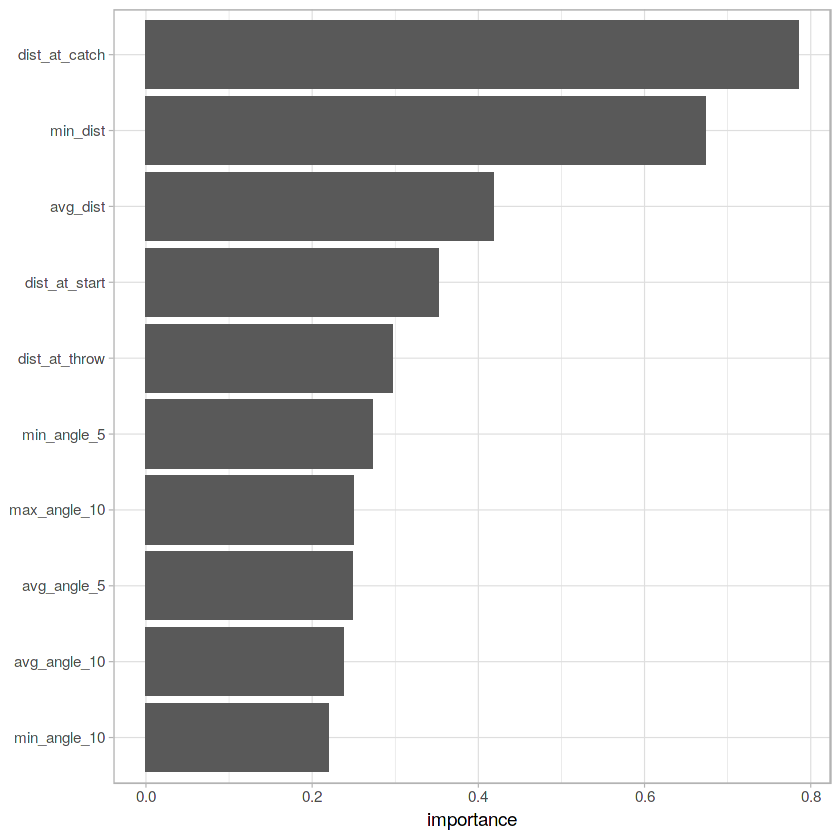

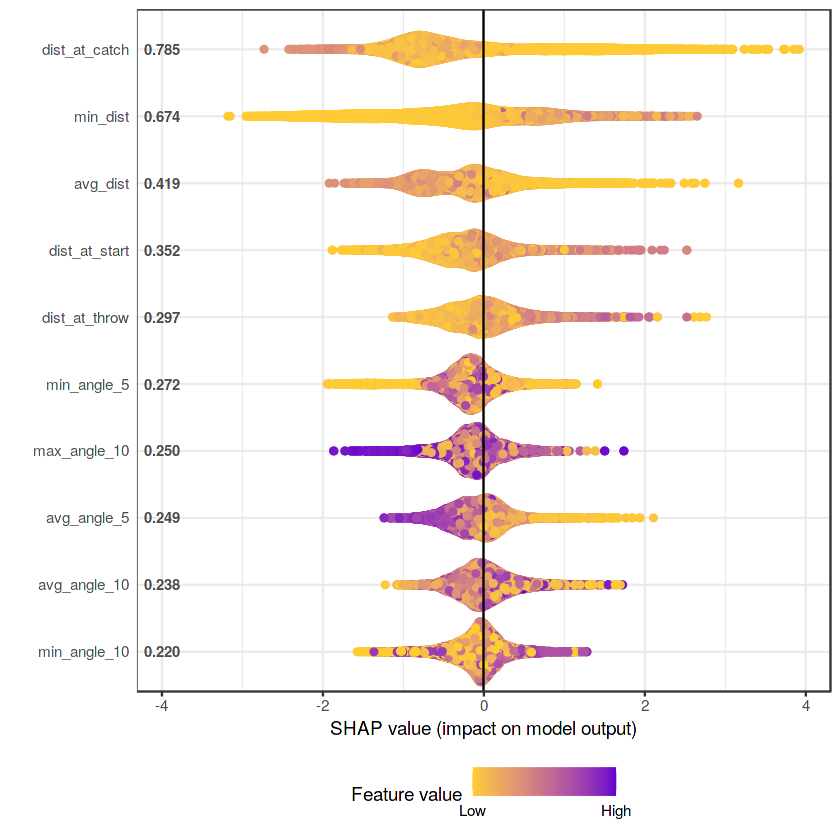

In [8]:
# Calculate SHAP importance
shap_result <- shap.score.rank(xgb_model = bst_1, 
                               X_train = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                              "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                              "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                              "type")]),
                               shap_approx = F)
# Plot SHAP importance
var_importance(shap_result, top_n=10)

shap_long = shap.prep(shap = shap_result,
                      X_train = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                     "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                     "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                     "type")]), 
                      top_n = 10)

# Plot SHAP impact
plot.shap.summary(data_long = shap_long)

We next fit the model to predict if a pass is complete or incomplete. 

[1]	train-auc:0.776941	train-error:0.285443 
[21]	train-auc:0.872339	train-error:0.202786 
[41]	train-auc:0.904165	train-error:0.171378 
[61]	train-auc:0.929140	train-error:0.143763 
[81]	train-auc:0.943352	train-error:0.126411 
[100]	train-auc:0.956594	train-error:0.108375 
make SHAP score by decreasing order



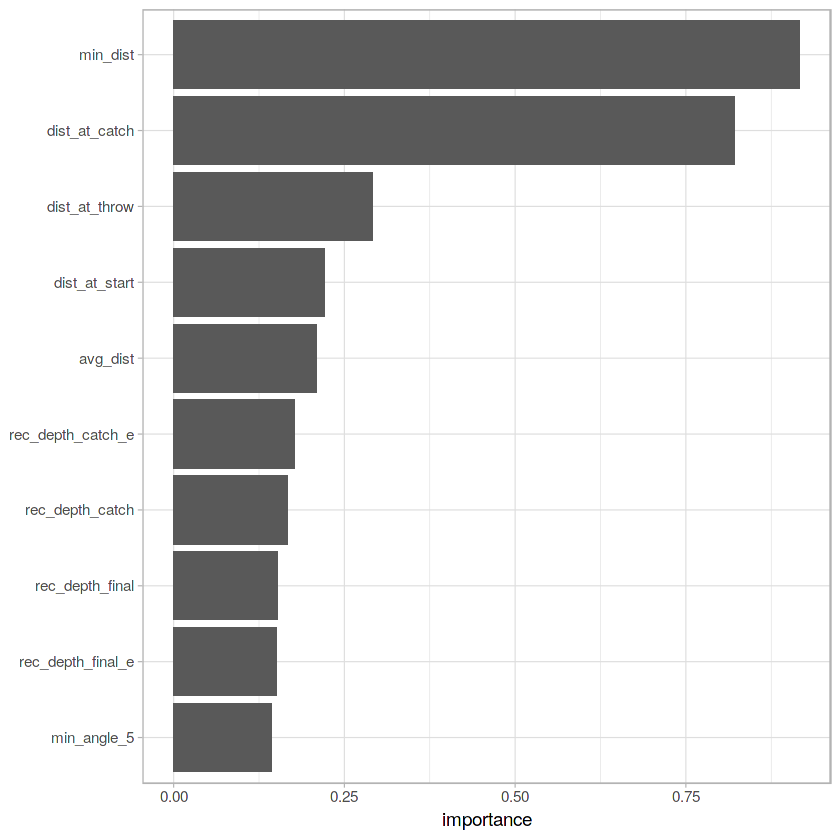

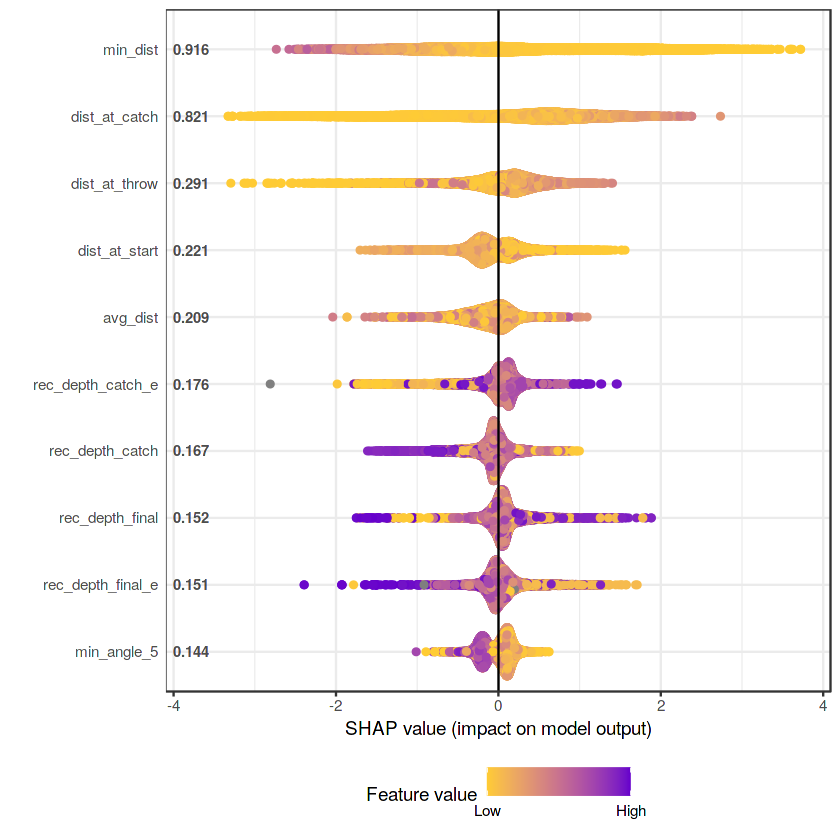

In [9]:
########## Predict Play Success ##########

play_res <- rep(0, nrow(use_dat))
play_res[use_dat$passResult == "C"] <- 1
use_dat$play_res <- play_res

dtrain2 <- xgb.DMatrix(data = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                                    "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                                    "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                                    "type", "rec_depth_catch", "rec_depth_final",       
                                                                    "rec_depth_catch_e", "rec_depth_final_e")]),
                      label = use_dat$play_res[])


set.seed(111111)
bst_2 <- xgboost(data = dtrain2, # Set training data
                 
                 nrounds = 100, # Set number of rounds
                 
                 verbose = 1, # 1 - Prints out fit
                 print_every_n = 20, # Prints out result every 20th iteration
                 
                 objective = "binary:logistic", # Set objective
                 eval_metric = "auc",
                 eval_metric = "error") # Set evaluation metric to use


# Calculate SHAP importance
shap_result2 <- shap.score.rank(xgb_model = bst_2, 
                               X_train = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                                                "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                                                "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                                                "type", "rec_depth_catch", "rec_depth_final",       
                                                                                "rec_depth_catch_e", "rec_depth_final_e")]),
                               shap_approx = F)
# Plot SHAP importance
var_importance(shap_result2, top_n=10)

shap_long2 = shap.prep(shap = shap_result2,
                      X_train = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                                                 "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                                                 "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                                                 "type", "rec_depth_catch", "rec_depth_final",       
                                                                                 "rec_depth_catch_e", "rec_depth_final_e")]), 
                      top_n = 10)


plot.shap.summary(data_long = shap_long2)

From the two models we see considerable overlap in the important variables. In particular we see the following variables appearing in the top 10 variables for both models:

* dist_at_catch - The distance at the catch pointis the most important variable in the pass interference model and the second most important variable in the pass success model.
* min_dist - The minimum distance between the defender and reciever is the second most important variable in the pass interference model and most important variable in the pass success model.
* avg_dist - The average distance is the third most important variable in the pass interference model and fourth most important variable in the pass success model.
* dist_at_start - The average distance is the fourth most important variable in the pass interference model and fifth most important variable in the pass success model.
* dist_at_throw - The distance at throw is the fifth most important variable in the pass interference model and the third most important variable in the pass success model.
* min_angle_5 - The minimum angle within five frames of the catch is the sixth most important in the pass interference model and sixth most important variable in the pass success model

Given the significant overlap between the important variable for both models it appears that there is a trade-off between commiting pass interference and succesfully defending a pass play. A top quality reciever is one who can both provide quality coverage and minimise pass interference calls. 

To quantify player quality we apply the models to the data to develop an expected value for pass interference and pass success for each play:

In [10]:
########## Predictions for players ##########

# Create data for PI
pi_data <- xgb.DMatrix(data = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                                     "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                                     "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                                     "type")]))
# Create data for pass success
pass_data <- xgb.DMatrix(data = as.matrix(use_dat[,c("avg_dist", "dist_at_start", "dist_at_throw", "min_dist",
                                                                                  "max_dist", "dist_at_catch", "min_angle_5", "min_angle_10", 
                                                                                  "max_angle_5", "max_angle_10", "avg_angle_5", "avg_angle_10",
                                                                                  "type", "rec_depth_catch", "rec_depth_final",       
                                                                                  "rec_depth_catch_e", "rec_depth_final_e")]))

# Predict to get expected values
pi_preds <- predict(bst_1, pi_data)
pass_preds <- predict(bst_2, pass_data)
# Store results in data frame
plot_data <- cbind.data.frame(use_dat$isDefensivePI, as.factor(use_dat$play_res), pi_preds, pass_preds)
names(plot_data) <- c("defensive_pi", "pass_result", "pi_pred", "pass_pred")



Visualizing the expected values it can be seen that as the expected vaue of pass interference increases the expected value of pass success decreases:

Inverted geom defaults of fill and color/colour.
To change them back, use invert_geom_defaults().



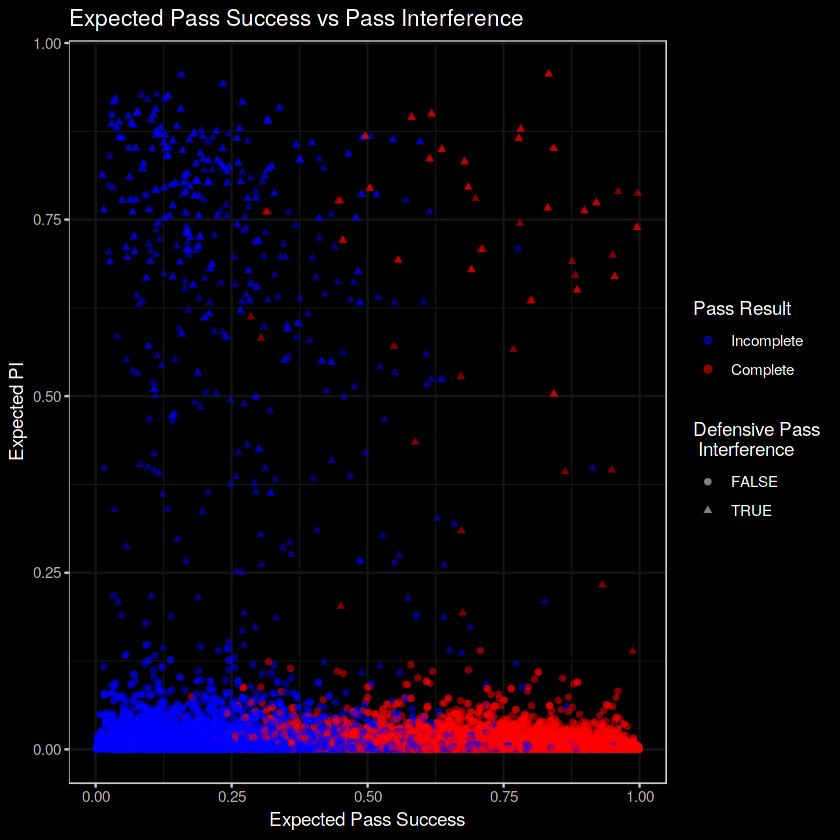

In [11]:

g_1 <- ggplot(plot_data, aes(x = pass_pred, y = pi_pred, color = pass_result, shape = defensive_pi)) +
  geom_point(alpha = 0.5) +
  scale_color_manual(values = c("1" = "Red", "0" = "blue"),
                     labels = c("1" = "Complete", "0" = "Incomplete")) +
  dark_theme_bw() +
  labs(x = "Expected Pass Success", y = "Expected PI",
       color = "Pass Result", shape = "Defensive Pass\n Interference",
       title = "Expected Pass Success vs Pass Interference") 
g_1


**Player Analysis**

For each defender we then sum up the following statistics:

* Targets - Number of targets against the defender.
* PI - Number of pass interference calls against the defnder.
* Success - Number of successful pass plays against the defender.
* Expected PI - Total expected PI value for the defender across the targets.
* Expected Success - Total expected succesful pass plays against defender across the targets.

We then calculate two metrics measuring the deviation from expected pass interference and pass success for each defender and average these values per target. 

A positive deviation for pass success per target from expected success (*dev_s_pt*) means that when targeting that player passes were completed at a higher rate than would be expected given the coverage they are carrying out and a negative deviation indicates that passes were completed at a lower rate than would be expected.

A positive deviation for PI per target from expected PI (*dev_pi_pt*) means that the player was called for pass interference at a higher rate than was expected and a negative deviation means they are called for pass interference at a lower rate than would be expected.

A top quality defender would be those who have negative values for both metrics. 

In [12]:
# Extract players and teams
players_id <- unique(use_dat[,c("play_defenders", "def_team")])
# Create vectors to store results
targets <- pi <- success <- pred_pi <- pred_success <- player_names <- rep(NA, nrow(players_id ))
# Sum up stats for each defender
for(i in 1:nrow(players_id )){
  targets[i] <- sum(use_dat$play_defenders == players_id$play_defenders[i] & use_dat$def_team == players_id$def_team[i])
  pi[i] <- sum(use_dat$isDefensivePI[use_dat$play_defenders == players_id$play_defenders[i] & use_dat$def_team == players_id$def_team[i]] == 1)
  success[i] <- sum(use_dat$play_res[use_dat$play_defenders == players_id$play_defenders[i] & use_dat$def_team == players_id$def_team[i]] == 1)
  pred_pi[i] <- sum(pi_preds[use_dat$play_defenders == players_id$play_defenders[i] & use_dat$def_team == players_id$def_team[i]])
  pred_success[i] <- sum(pass_preds[use_dat$play_defenders == players_id$play_defenders[i] & use_dat$def_team == players_id$def_team[i]])
  player_names[i] <- players$displayName[players$nflId == players_id$play_defenders[i]]
}
# Join results in table
res_table <- cbind.data.frame(players_id, targets, pi, success, pred_pi, pred_success, player_names)
# View Top Rows
head(res_table[order(res_table$targets, decreasing = TRUE),])

# Calculate deviation from success
res_table$dev_success <- res_table$success - res_table$pred_success
# Calculate deviation from PI
res_table$dev_pi <- res_table$pi - res_table$pred_pi
# Calculate deviation per target
res_table$dev_s_pt <- res_table$dev_success/res_table$targets
res_table$dev_pi_pt <- res_table$dev_pi/res_table$targets



play_defenders,def_team,targets,pi,success,pred_pi,pred_success,player_names
<fct>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>
2560970,7,134,4,81,3.8796264,79.65566,610
2558176,6,125,1,60,1.1107210,66.56798,432
494287,21,123,1,79,1.2115136,77.39340,393
2552385,6,123,4,77,4.1394456,74.46822,20
2552389,8,122,3,75,2.9488080,74.91038,290
2555158,31,119,0,68,0.8564242,71.68324,754


To analyse the indiviudal players we only consider those players who faced fifty or more targets during the season. From this plot we can see that Darius Slay was highly effective at both defending passes and avoiding pass interference calls. Joe Haden was effective at defending passes but gave up more pass interference calls than expected. Prince Amukamara was both less effective at defending passes and avoid pass interference calls.  



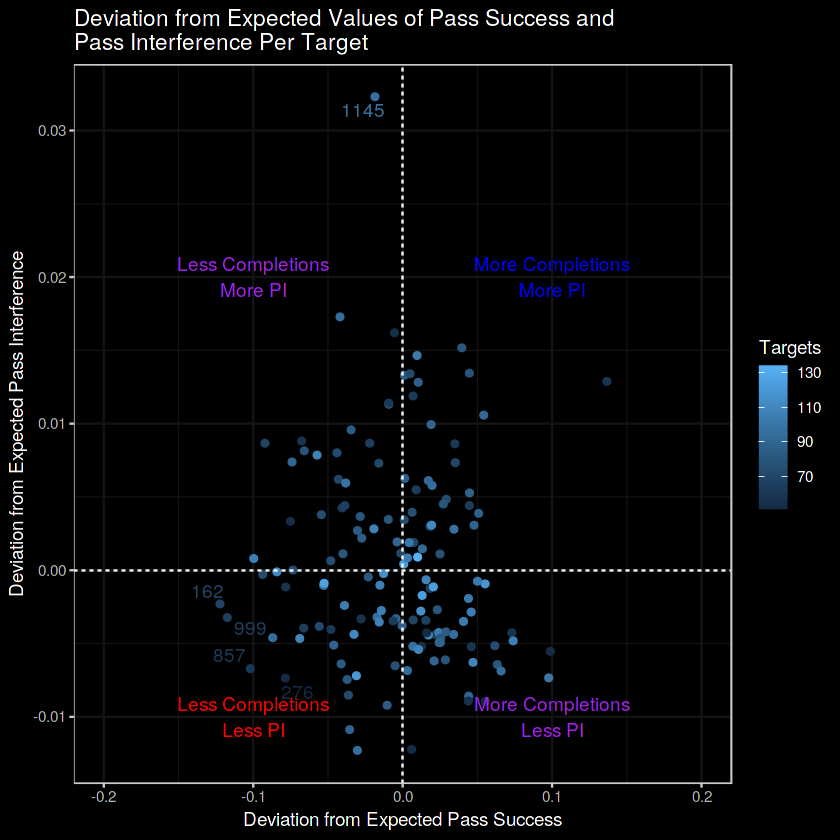

In [13]:
# Select players with 50 or more targets
res_table_2 <- res_table[res_table$targets > 50, ]
# Select players for labels
res_table_3 <- res_table_2[(res_table_2$dev_s_pt < -0.05 &
                              res_table_2$dev_pi_pt < -0.005) | 
                             (res_table_2$dev_s_pt < -0.1 ) |
                             (res_table_2$dev_pi_pt > 0.02), ]


# Plot deviation from expected value
g_2 <- ggplot(res_table_2, aes(x = dev_s_pt, y= dev_pi_pt, color = targets)) +
  geom_point() +
  dark_theme_bw() +
  geom_hline(yintercept = 0, linetype = 2) +
  geom_vline(xintercept = 0, linetype = 2) +
  annotate("text", x = 0.1, y = 0.02, label = "More Completions\nMore PI", color = "blue") +
  annotate("text", x = 0.1, y = -0.01, label = "More Completions\nLess PI", color = "purple") +
  annotate("text", x = -0.1, y = 0.02, label = "Less Completions\nMore PI", color = "purple") +
  annotate("text", x = -0.1, y = -0.01, label = "Less Completions\nLess PI", color = "red") +
  xlim(-0.2, 0.2) +
  labs(x = "Deviation from Expected Pass Success",
       y = "Deviation from Expected Pass Interference",
       color = "Targets",
       title = "Deviation from Expected Values of Pass Success and\nPass Interference Per Target") +
  geom_text_repel(data = res_table_3, aes(x = dev_s_pt, y= dev_pi_pt, label = player_names))
g_2




When we looked at the top_dawgs table, which included defenders whose *dev_s_pt* was less than -0.5, *dev_pi_pt* was less than 0, and targets were greater than 75, only 12 defenders made the cut. Of those 12, the only team with more than 1 who made the list were the New England Patriots, potential further proof of their defensive dominance during the 2018 season. To look at this at a deeper level, we looked at the parent table for top_dawgs, less_pi_less_success. Again, the New England Patriots had the highest representation, with 4 defenders making the list. It is important to note that one of the important filters added to the less_pi_less_success table to get to top_dawgs was the number of targets, where many defenders in less_pi_less_success had 15 or less targets on the season. The table [top_dawgs] was in line with at least some of our preconceived notions, and included top-level defensive backs like Desmond King, Jason McCourty, Pierre Desir and Darius Slay. These defenders performed, on average, significantly better than the model had predicted them to. 

Breaking top_dawgs down by category, the top performer in dev_success was Pierre Desir, the top performer in dev_pi was Darius Slay, the top performer in dev_s_pt was Taron Johnson, the top performer in dev_pi_pt was Darius Slay. These categories can be used to help grade players, week by week, track player improvement over time, as well as isolate potential in players that can be harder to track with the naked eye. For example, Taron Johnson stood out as one of the best defenders in our analysis. Yet, until this season, he has not been seen as a 'top-level' defensive back in the NFL. With this type of modeling technique, expectations can be more clearly defined, and players who are performing better than expectations can be easily isolated. 


In [14]:
less_pi_less_success <- res_table[res_table$dev_s_pt < -.05 &
                                    res_table$dev_pi_pt < 0,]

top_dawgs <- less_pi_less_success[less_pi_less_success$targets > 75,]

summary(as.factor(top_dawgs$def_team))

top_dawgs

2  5  6  8 21 
 1  1  1  1  1

play_defenders,def_team,targets,pi,success,pred_pi,pred_success,player_names,dev_success,dev_pi,dev_s_pt,dev_pi_pt
<fct>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
2560916,8,95,1,50,1.0986127,55.02426,363,-5.024264,-0.09861272,-0.05288699,-0.0010380287
2555175,5,108,0,56,0.5028183,63.43811,555,-7.438105,-0.50281827,-0.06887135,-0.0046557248
2558176,6,125,1,60,1.1107210,66.56798,432,-6.567978,-0.11072096,-0.05254382,-0.0008857677
2558184,2,111,4,59,4.0121804,68.34750,296,-9.347498,-0.01218042,-0.08421170,-0.0001097336
89756,21,95,0,51,0.4372727,59.25913,577,-8.259131,-0.43727274,-0.08693822,-0.0046028709


Some next steps:

A potential next step would be to include physical attributes of each player as features in the predictive model and see if and how the results differ with the knowledge of player heights and weights. Another future addition would be to factor wpa and epa into the model to better weight one PI, completion, incompletion, etc over another result. This would help build a more complex understanding of which defenders are making or allowing "big" plays.